Script needs the following functionality:

- Generate "false" data, i.e. do rotation.
- Generate plots for publication.
- Integrated spots, integrated annotations.
- Histology registered with landmarks.


In [41]:
import json
import glob

import os
from os.path import exists, join

import cv2
import SimpleITK as sitk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from miit.spatial_data.base_types import DefaultImage, Pointset, Annotation
from miit.spatial_data.section import Section
from miit.spatial_data.spatial_omics.visium import Visium
from miit.spatial_data.spatial_omics.imzml import Imzml

In [2]:
config_dir = '../../../spami/configs/cores_hr/'

config_files = glob.glob(join(config_dir, '*.json'))

In [3]:
images = []
for config_file in config_files:
    with open(config_file) as f:
        config = json.load(f)
    fname = os.path.basename(config_file)
    img = sitk.GetArrayFromImage(sitk.ReadImage(config['sections'][0]['image_path']))
    images.append((fname, img))

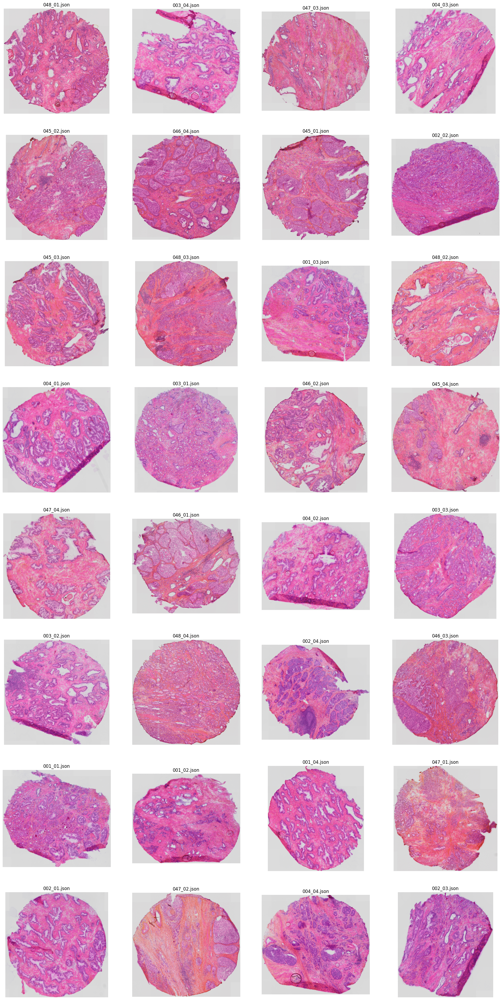

In [4]:
fig, axs = plt.subplots(8, 4, figsize=(6 * 4, 6 * 8))
idx = 0
for i in range(8):
    for j in range(4):
        axs[i,j].axis('off')
        axs[i,j].imshow(images[idx][1])
        axs[i,j].set_title(images[idx][0])
        idx += 1

In [5]:
config_file = [x for x in config_files if '002_04' in x][0]
with open(config_file) as f:
    config = json.load(f)
    
config

{'name': '002_04',
 'sections': [{'name': '002 HE R1_4.vsi - 20x_04',
   'id': 1,
   'image_path': '/mnt/scratch/maximilw/data/multiomics/hes_scans/high_res/original_images/002 HE R1_4.vsi - 20x_04.tif',
   'segmentation_mask_path': '/mnt/scratch/maximilw/data/multiomics/hes_scans/high_res/original_masks/002 HE R1_4.vsi - 20x_04.tif',
   'landmarks_path': '/mnt/scratch/maximilw/data/multiomics/landmarks_hr/002_04/01.csv'},
  {'name': '002_ST_V19S23_002_4_04',
   'id': 2,
   'image_path': '/mnt/scratch/maximilw/data/multiomics/spatial_transcriptomics/high_res/original_images/002_ST_V19S23_002_4_04.tif',
   'segmentation_mask_path': '/mnt/scratch/maximilw/data/multiomics/spatial_transcriptomics/high_res/original_masks/002_ST_V19S23_002_4_04.tif',
   'molecular_imaging_data': {'data_type': 'Visium10X',
    'image_scale': 'hires',
    'load_type': 'spcrng_directory',
    'spcrng_directory': '/mnt/archive/prostomics/processed_data/rna_analysis/spatial_transcriptomics/pilot/spcrng/batch1D_09

In [58]:
def load_msi(config):
    image = DefaultImage(data=sitk.GetArrayFromImage(sitk.ReadImage(config['image_path'])))
    preregistration = config['preregistration']
    use_srd_ann = config['use_srd_ann']
    srd_path = config['srd']
    imzml = config['imzml']
    ibd = config['ibd']
    data = Imzml.load_msi_data(image, 
                               imzml, 
                               'msi negative mode', 
                               config,
                               srd_path,
                               use_srd_ann,
                               preregistration)
    return data
    
def load_section(config):
    img = sitk.GetArrayFromImage(sitk.ReadImage(config['image_path']))
    ref_img = DefaultImage(data=img)
    id_ = config['id']
    tissue_mask = sitk.GetArrayFromImage(sitk.ReadImage(config['segmentation_mask_path']))
    tissue_mask = Annotation(data=tissue_mask, name='tissue_mask')
    landmarks = pd.read_csv(config['landmarks_path'])
    landmarks = Pointset(data=landmarks, name='landmarks')
    section = Section(reference_image=ref_img, annotations=[tissue_mask, landmarks], name=str(config['id']))
    mic = config.get('molecular_imaging_data', None)
    if mic is not None:
        mic_type = mic['data_type']
        if mic_type == 'Visium10X':
            directory = mic['spcrng_directory']
            image_scale = mic['image_scale']
            mic_data = Visium.from_spcrng(directory, image_scale, mic)
        elif mic_type == 'ScilsExportImzml':
            mic_data = load_msi(mic)
            # mic_data = Imzml.from_config(mic)
        section.so_data.append(mic_data)
    named_anns_conf = config.get('named_annotations', None)
    if named_anns_conf is not None:
        for named_anns_conf_ in named_anns_conf:
            ann_img = sitk.GetArrayFromImage(sitk.ReadImage(named_anns_conf_['annotation_path']))
            with open(named_anns_conf_['label_path']) as f:
                labels = [x.strip() for x in f.readlines()]
            ann = Annotation(data=ann_img, labels=labels, name='tissue_classes')
            section.annotations.append(ann)
    anns = config.get('annotations', None)
    if anns is not None:
        for ann_ in anns:
            ann_img = sitk.GetArrayFromImage(sitk.ReadImage(ann_))
            ann = Annotation(data=ann_img, name='tissue_classes')
            section.annotations.append(ann)
    return section
    # return img, id_, tissue_mask, landmarks

def sort_sections(sections):
    sorted_sections = sorted(sections, key=lambda x: int(x.name))
    return sorted_sections

In [8]:
# img, id_, tissue_mask, landmarks = load_section(config['sections'][0])
section = load_section(config['sections'][0])

In [59]:
sections = []
section_config = config['sections']
for section_config_ in section_config:
    section = load_section(section_config_)
    sections.append(section)
sections = sort_sections(sections)

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [ ]:
len(sections)

9

In [ ]:
target_dir = 'data/test_data_publication'

In [ ]:
for idx, section in enumerate(sections):
    target_sub_dir = join(target_dir, section.name)
    hist_path = join(target_sub_dir, 'hist_image.png')
    sitk.WriteImage(sitk.GetImageFromArray(section.reference_image.data), hist_path)
    lms = section.get_annotations_by_names('landmarks')
    if lms is not None:
        lms = lms.data.copy()
        if 'Unnamed: 0' in lms.columns:
            lms.drop('Unnamed: 0', axis=1, inplace=True)
        lm_path = join(target_sub_dir, 'landmarks.csv')
        lms.to_csv(lm_path, index=False)
    tissue_mask = section.get_annotations_by_names('tissue_mask')
    if tissue_mask is not None:
        tissue_mask = section.data.copy()
        tissue_mask_path = join(target_sub_dir, 'tissue_mask.png')
        cv2.imwrite(tissue_mask_path, tissue_mask)
        
    

In [55]:
for section in sections:
    print([x.name for x in section.annotations])

['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks', 'tissue_classes']
['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks', 'tissue_classes']
['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks']
['tissue_mask', 'landmarks']


In [28]:
section = sections[0]
section.annotations[1].name
lms = section.get_annotations_by_names('landmarks').data.copy()
if 'Unnamed: 0' in lms.columns:
    lms.drop('Unnamed: 0', axis=1, inplace=True)
lms

,label,x,y
0,Pt-0,1686.433985,2440.510910
1,Pt-1,1813.242243,2495.471199
2,Pt-2,1965.553242,2499.777760
3,Pt-3,2046.381663,2360.044020
4,Pt-4,1841.770285,2454.437553
...,...,...,...
106,Pt-106,1239.481533,1471.146514
107,Pt-107,1330.288671,1924.572689
108,Pt-108,1350.361325,2305.438490
109,Pt-109,597.608193,2072.976476


In [30]:
tissue_mask = section.get_annotations_by_names('tissue_mask')
tissue_mask

Annotation(data=array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), name='tissue_mask', _id=UUID('2c898a5c-798a-11ef-a59e-fa163eee643f'), meta_information=defaultdict(<class 'dict'>, {}), labels={1: 1}, is_multichannel=True)

In [42]:
tm = np.dstack((tissue_mask.data, tissue_mask.data, tissue_mask.data, tissue_mask.data))
cv2.imwrite('test.png', tm)

True

In [60]:
section = sections[1]
ann = section.get_annotations_by_names('tissue_classes')

In [61]:
ann.labels

['empty*',
 'Tumor',
 'stroma',
 'Immune cells',
 'Necrosis',
 'Other',
 'Region*',
 'Ignore*',
 'gland',
 'tissue',
 'gland_lumen',
 'tissue_fold',
 'ISUP 1 (3+3)',
 'ISUP 2 (3+4)',
 'Normal glands',
 'Usikker, uegnet for vurdering',
 'Atrofi',
 'Gleason 3',
 'ISUP 3 (4+3)',
 'ISUP 5 (>8)',
 'ISUP 4 (4+4)',
 'Lymfocytter',
 'Gleason 5',
 'Benign hyperplasia (BH)',
 'what_is_this',
 'Gleason 4',
 'Normal epithel',
 'maybe Lymfocytter',
 'ISUP4 but uncertain low Qual stain',
 'check this ISUP 4',
 'ISUP 1 or 4 - uncertain further IHC needed p63',
 'ISUP 3 or 5 - uncertain due to stain quality',
 'lymfocytt-enriched stroma']

In [63]:
ann.data.shape

(33, 2782, 2636)

In [44]:
a = cv2.imread('test.png')
a.shape

(2701, 3077, 3)

In [48]:
b = sitk.GetArrayFromImage(sitk.ReadImage('test.png'))
b.shape

(2701, 3077, 4)

In [35]:
tissue_mask.data.shape

(2701, 3077)

In [29]:
[x.name for x in section.annotations]

['tissue_mask', 'landmarks']

In [8]:
section_config_

{'name': '002 M+ V6 HES.vsi - 20x_BF_04',
 'id': 6,
 'image_path': '/mnt/scratch/maximilw/data/multiomics/hes_scans/high_res/original_images/002 M+ V6 HES.vsi - 20x_BF_04.tif',
 'segmentation_mask_path': '/mnt/scratch/maximilw/data/multiomics/hes_scans/high_res/original_masks/002 M+ V6 HES.vsi - 20x_BF_04.tif',
 'molecular_imaging_data': {'data_type': 'ScilsExportImzml',
  'image_path': '/mnt/scratch/maximilw/data/multiomics/hes_scans/high_res/original_images/002 M+ V6 HES.vsi - 20x_BF_04.tif',
  'preregistration': True,
  'use_srd_ann': True,
  'srd': '/mnt/scratch/maximilw/data/scils_export_pos_ion_mode/002_04.srd',
  'imzml': '/mnt/scratch/maximilw/data/scils_export_pos_ion_mode/002_04-root mean square.imzML',
  'ibd': '/mnt/scratch/maximilw/data/scils_export_pos_ion_mode/002_04-root mean square.ibd'},
 'landmarks_path': '/mnt/scratch/maximilw/data/multiomics/landmarks_hr/002_04/06.csv'}

In [31]:
# image = sitk.GetArrayFromImage(sitk.ReadImage(section_config_['image_path']))
# plt.imshow(image)

In [32]:
msi_data = load_msi(section_config_['molecular_imaging_data'])

/home/maximilw/.local/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


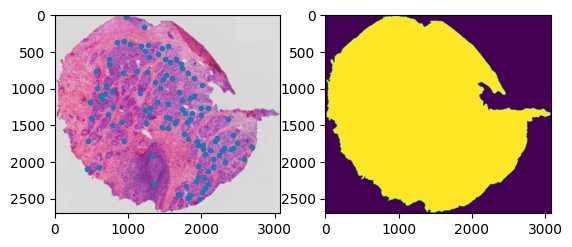

In [12]:
fig, axs = plt.subplots(1, 2)
axs[0].imshow(section.reference_image.data)
ps = section.get_annotations_by_names('landmarks').data
ps.drop('Unnamed: 0', axis=1, inplace=True)
axs[0].plot(ps.x, ps.y, '.')
axs[1].imshow(section.annotations[0].data)

In [14]:
section_dr

01_data_types.ipynb                      integrated_msi.csv
02_integrate_st_and_msi.ipynb            integrated_msi_neg.ibd
03_integrate_msi_and_msi.ipynb           integrated_msi_neg.imzML
04_generate_stats_for_publication.ipynb  testing_notebook.ipynb
integrated_annotation.csv


,label,x,y
0,Pt-0,1686.433985,2440.510910
1,Pt-1,1813.242243,2495.471199
2,Pt-2,1965.553242,2499.777760
3,Pt-3,2046.381663,2360.044020
4,Pt-4,1841.770285,2454.437553
...,...,...,...
106,Pt-106,1239.481533,1471.146514
107,Pt-107,1330.288671,1924.572689
108,Pt-108,1350.361325,2305.438490
109,Pt-109,597.608193,2072.976476
